<a href="https://colab.research.google.com/github/DanusornBOTGOM/BOTGOM2/blob/main/Train_model_BAR1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [18]:
!pip install --upgrade torch torchvision

In [19]:
import numpy as np
import cv2
from os import listdir # Os เป็น ไลบารี่จัดการไฟล์
from os.path import isfile, join # อ่านรูปภาพที่อยู่ในโฟลเดอร์
from tqdm import tqdm # Moniter ให้เห็นการ Procees ของคำสั่ง
import tensorflow as tf
import keras
from keras.models import Sequential #พวก keras ใช้ในการจัดการ Model
from keras.layers import Dense, Dropout, Activation, Flatten , Conv2D, MaxPool2D #ใช้ในการจัดการ Model
import matplotlib.pyplot as plt
import os
import pandas as pd
from sklearn.model_selection import train_test_split

In [25]:
import shutil
shutil.rmtree('/content/drive', ignore_errors=True)

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [23]:
# กำหนด path ของโฟลเดอร์หลัก
main_path = "/content/drive/MyDrive/Colab Notebooks/Image Processing"

In [24]:
print(os.listdir(main_path))

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Colab Notebooks/Image Processing'

(<Axes: >, <matplotlib.image.AxesImage at 0x7f6121b0e980>)

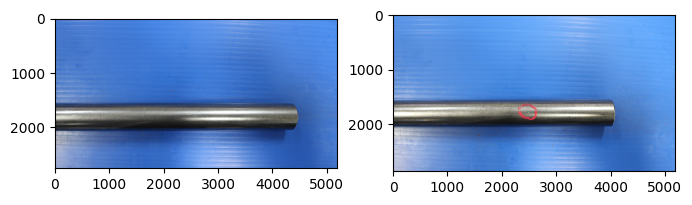

In [8]:
img1 = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Image Processing/train/good/IMG_5887.JPG')
img1 = cv2.cvtColor(img1 , cv2.COLOR_BGR2RGB)

img2 = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Image Processing/train/ng/IMG_5845.JPG')
img2 = cv2.cvtColor(img2 , cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8,4))
plt.subplot(121),plt.imshow(img1)
plt.subplot(122),plt.imshow(img2)

In [9]:
def print_directory_structure(path, level=0):
    for item in os.listdir(path):
        print("  " * level + "- " + item)
        if os.path.isdir(os.path.join(path, item)):
            print_directory_structure(os.path.join(path, item), level + 1)

print_directory_structure(main_path)

- test
  - good
    - IMG_5590.JPG
    - IMG_5591.JPG
    - IMG_5597.JPG
    - IMG_5599.JPG
    - IMG_5602.JPG
    - IMG_5603.JPG
    - IMG_5604.JPG
    - IMG_5605.JPG
    - IMG_5607.JPG
    - IMG_5608.JPG
    - IMG_5610.JPG
    - IMG_5662.JPG
    - IMG_5663.JPG
    - IMG_5664.JPG
    - IMG_5667.JPG
    - IMG_5668.JPG
    - IMG_5669.JPG
    - IMG_5671.JPG
    - IMG_5672.JPG
    - IMG_5674.JPG
    - IMG_5858.JPG
    - IMG_5859.JPG
    - IMG_5860.JPG
    - IMG_5861.JPG
    - IMG_5862.JPG
    - IMG_5863.JPG
    - IMG_5865.JPG
    - IMG_5866.JPG
    - IMG_5867.JPG
    - IMG_5868.JPG
    - IMG_5869.JPG
    - IMG_5873.JPG
    - IMG_5874.JPG
    - IMG_5875.JPG
    - IMG_5876.JPG
    - IMG_5877.JPG
    - IMG_5878.JPG
    - IMG_5586.JPG
    - IMG_5675.JPG
    - IMG_5677.JPG
    - IMG_5678.JPG
    - IMG_5679.JPG
    - IMG_5680.JPG
    - IMG_5730.JPG
    - IMG_5734.JPG
    - IMG_5735.JPG
  - ng
    - IMG_5566.JPG
    - IMG_5593.JPG
    - IMG_5641.JPG
    - IMG_5649.JPG
    - IMG_5661.JPG
    - IM

In [10]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from tqdm import tqdm

def remove_background(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower_blue = np.array([90, 50, 50])
    upper_blue = np.array([130, 255, 255])
    mask = cv2.inRange(hsv, lower_blue, upper_blue)
    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    return cv2.bitwise_not(mask)

def detect_shaft_from_mask(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        shaft_mask = np.zeros(mask.shape, dtype=np.uint8)
        cv2.drawContours(shaft_mask, [largest_contour], 0, 255, -1)
        kernel = np.ones((5,5), np.uint8)
        shaft_mask = cv2.morphologyEx(shaft_mask, cv2.MORPH_CLOSE, kernel)
        shaft_mask = cv2.morphologyEx(shaft_mask, cv2.MORPH_OPEN, kernel)
        return shaft_mask
    return None

def preprocess_image(image_path, output_path):
    image = cv2.imread(image_path)
    if image is None:
        print(f"ไม่สามารถอ่านไฟล์ภาพได้: {image_path}")
        return
    image_resized = cv2.resize(image, (224, 224))
    background_mask = remove_background(image_resized)
    shaft_mask = detect_shaft_from_mask(background_mask)
    if shaft_mask is not None:
        result = cv2.bitwise_and(image_resized, image_resized, mask=shaft_mask)
        cv2.imwrite(output_path, result)
    else:
        print(f"ไม่สามารถตรวจจับเพลาได้: {image_path}")

# กำหนด path ของโฟลเดอร์หลัก
main_path = "/content/drive/MyDrive/Colab Notebooks/Image Processing"

# นับจำนวนไฟล์ทั้งหมด
total_files = sum([len(os.listdir(os.path.join(main_path, split, category)))
                   for split in ['train', 'test']
                   for category in ['good', 'ng']])

# สร้าง progress bar
pbar = tqdm(total=total_files, unit='image')

# ทำ pre-processing สำหรับทุกภาพใน train และ test
for split in ['train', 'test']:
    for category in ['good', 'ng']:
        input_folder = os.path.join(main_path, split, category)
        output_folder = os.path.join(main_path, f"{split}_processed", category)
        os.makedirs(output_folder, exist_ok=True)
        for img_name in os.listdir(input_folder):
            input_path = os.path.join(input_folder, img_name)
            output_path = os.path.join(output_folder, img_name)
            preprocess_image(input_path, output_path)
            pbar.update(1)  # อัพเดท progress bar

pbar.close()  # ปิด progress bar เมื่อเสร็จสิ้น
print("Pre-processing เสร็จสิ้น")

100%|██████████| 301/301 [02:51<00:00,  1.76image/s]

Pre-processing เสร็จสิ้น


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
from tqdm import tqdm

class ShaftDataset(Dataset):
    def __init__(self, main_path, split, transform=None):
        self.main_path = main_path
        self.split = split
        self.transform = transform
        self.images = []
        self.labels = []

        # โหลดข้อมูล good
        good_path = os.path.join(main_path, f"{split}_processed", 'good')
        for img_name in os.listdir(good_path):
            self.images.append(os.path.join(good_path, img_name))
            self.labels.append(0)  # 0 for good

        # โหลดข้อมูล ng
        ng_path = os.path.join(main_path, f"{split}_processed", 'ng')
        for img_name in os.listdir(ng_path):
            self.images.append(os.path.join(ng_path, img_name))
            self.labels.append(1)  # 1 for ng

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

# กำหนด path ของโฟลเดอร์หลัก
main_path = "/content/drive/MyDrive/Colab Notebooks/Image Processing"

# กำหนด transforms
data_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# สร้าง DataLoader
train_dataset = ShaftDataset(main_path, 'train', transform=data_transforms)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

test_dataset = ShaftDataset(main_path, 'test', transform=data_transforms)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# เลือกโมเดล (ตัวอย่างใช้ ResNet18)
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 2)  # 2 classes: good and ng

# กำหนด loss function และ optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# เทรนโมเดล
num_epochs = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}') # progress bar
    for inputs, labels in pbar:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        pbar.set_postfix({'loss': loss.item()})

    epoch_loss = running_loss / len(train_dataset)
    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}')

# ประเมินผลโมเดลบน test set
model.eval()
correct = 0
total = 0
pbar = tqdm(test_loader, desc='Evaluating') # progress bar
with torch.no_grad():
    for inputs, labels in pbar:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        pbar.set_postfix({'accuracy': 100 * correct / total})

print(f'Accuracy on test set: {100 * correct / total:.2f}%')

# บันทึกโมเดล
torch.save(model.state_dict(), os.path.join(main_path, 'shaft_model.pth'))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 70.5MB/s]
Epoch 1/10: 100%|██████████| 8/8 [01:18<00:00,  9.85s/it, loss=0.00216]


Epoch 1/10, Loss: 0.2916


Epoch 2/10: 100%|██████████| 8/8 [01:11<00:00,  9.00s/it, loss=0.00173]


Epoch 2/10, Loss: 0.0190


Epoch 3/10: 100%|██████████| 8/8 [01:10<00:00,  8.78s/it, loss=0.044]


Epoch 3/10, Loss: 0.0090


Epoch 4/10: 100%|██████████| 8/8 [01:13<00:00,  9.24s/it, loss=0.0853]


Epoch 4/10, Loss: 0.0054


Epoch 5/10: 100%|██████████| 8/8 [01:11<00:00,  8.89s/it, loss=0.00852]


Epoch 5/10, Loss: 0.0678


Epoch 6/10: 100%|██████████| 8/8 [01:09<00:00,  8.67s/it, loss=0.000447]


Epoch 6/10, Loss: 0.0129


Epoch 7/10: 100%|██████████| 8/8 [01:10<00:00,  8.79s/it, loss=0.00278]


Epoch 7/10, Loss: 0.0025


Epoch 8/10: 100%|██████████| 8/8 [01:11<00:00,  8.90s/it, loss=1.21]


Epoch 8/10, Loss: 0.0633


Epoch 9/10: 100%|██████████| 8/8 [01:09<00:00,  8.66s/it, loss=0.00126]


Epoch 9/10, Loss: 0.0326


Epoch 10/10: 100%|██████████| 8/8 [01:10<00:00,  8.77s/it, loss=0.0011]


Epoch 10/10, Loss: 0.0706


Evaluating: 100%|██████████| 3/3 [00:06<00:00,  2.20s/it, accuracy=61.5]


Accuracy on test set: 61.54%


In [11]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import os
from tqdm import tqdm

class ShaftDataset(Dataset):
    def __init__(self, main_path, split, transform=None):
        self.main_path = main_path
        self.split = split
        self.transform = transform
        self.images = []
        self.labels = []

        # โหลดข้อมูล good
        good_path = os.path.join(main_path, f"{split}_processed", 'good')
        for img_name in os.listdir(good_path):
            self.images.append(os.path.join(good_path, img_name))
            self.labels.append(0)  # 0 for good

        # โหลดข้อมูล ng
        ng_path = os.path.join(main_path, f"{split}_processed", 'ng')
        for img_name in os.listdir(ng_path):
            self.images.append(os.path.join(ng_path, img_name))
            self.labels.append(1)  # 1 for ng

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

# กำหนด path ของโฟลเดอร์หลัก
main_path = "/content/drive/MyDrive/Colab Notebooks/Image Processing"

# กำหนด transforms
data_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# สร้าง DataLoader
train_dataset = ShaftDataset(main_path, 'train', transform=data_transforms)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

test_dataset = ShaftDataset(main_path, 'test', transform=data_transforms)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# เลือกโมเดล (ตัวอย่างใช้ ResNet18)
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 2)  # 2 classes: good and ng

# กำหนด loss function และ optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# เพิ่มบรรทัดนี้ก่อนเริ่มลูปการเทรน
train_losses = []
train_accuracies = []

# เทรนโมเดล
num_epochs = 10
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')
    for inputs, labels in pbar:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        pbar.set_postfix({'loss': loss.item(), 'accuracy': 100 * correct / total})

    epoch_loss = running_loss / len(train_dataset)
    epoch_accuracy = 100 * correct / total

    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_accuracy)

    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.2f}%')

# ประเมินผลโมเดลบน test set
model.eval()
correct = 0
total = 0
pbar = tqdm(test_loader, desc='Evaluating') # progress bar
with torch.no_grad():
    for inputs, labels in pbar:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        pbar.set_postfix({'accuracy': 100 * correct / total})

print(f'Accuracy on test set: {100 * correct / total:.2f}%')

# บันทึกโมเดล
torch.save(model.state_dict(), os.path.join(main_path, 'shaft_model.pth'))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 176MB/s]
Epoch 1/10: 100%|██████████| 8/8 [00:04<00:00,  1.84it/s, loss=0.00127, accuracy=92.8]


Epoch 1/10, Loss: 0.1760, Accuracy: 92.80%


Epoch 2/10: 100%|██████████| 8/8 [00:04<00:00,  1.99it/s, loss=0.000214, accuracy=99.2]


Epoch 2/10, Loss: 0.0139, Accuracy: 99.15%


Epoch 3/10: 100%|██████████| 8/8 [00:04<00:00,  1.95it/s, loss=0.0266, accuracy=100]


Epoch 3/10, Loss: 0.0094, Accuracy: 100.00%


Epoch 4/10: 100%|██████████| 8/8 [00:04<00:00,  1.92it/s, loss=2.21e-5, accuracy=100]


Epoch 4/10, Loss: 0.0003, Accuracy: 100.00%


Epoch 5/10: 100%|██████████| 8/8 [00:04<00:00,  1.87it/s, loss=0.000137, accuracy=100]


Epoch 5/10, Loss: 0.0006, Accuracy: 100.00%


Epoch 6/10: 100%|██████████| 8/8 [00:04<00:00,  1.92it/s, loss=0.000198, accuracy=99.6]


Epoch 6/10, Loss: 0.0153, Accuracy: 99.58%


Epoch 7/10: 100%|██████████| 8/8 [00:03<00:00,  2.37it/s, loss=0.000991, accuracy=100]


Epoch 7/10, Loss: 0.0019, Accuracy: 100.00%


Epoch 8/10: 100%|██████████| 8/8 [00:03<00:00,  2.07it/s, loss=0.00216, accuracy=100]


Epoch 8/10, Loss: 0.0007, Accuracy: 100.00%


Epoch 9/10: 100%|██████████| 8/8 [00:04<00:00,  1.95it/s, loss=2.33, accuracy=98.7]


Epoch 9/10, Loss: 0.1188, Accuracy: 98.73%


Epoch 10/10: 100%|██████████| 8/8 [00:03<00:00,  2.08it/s, loss=0.00916, accuracy=98.7]


Epoch 10/10, Loss: 0.0448, Accuracy: 98.73%


Evaluating: 100%|██████████| 3/3 [00:00<00:00,  6.06it/s, accuracy=67.7]

Accuracy on test set: 67.69%


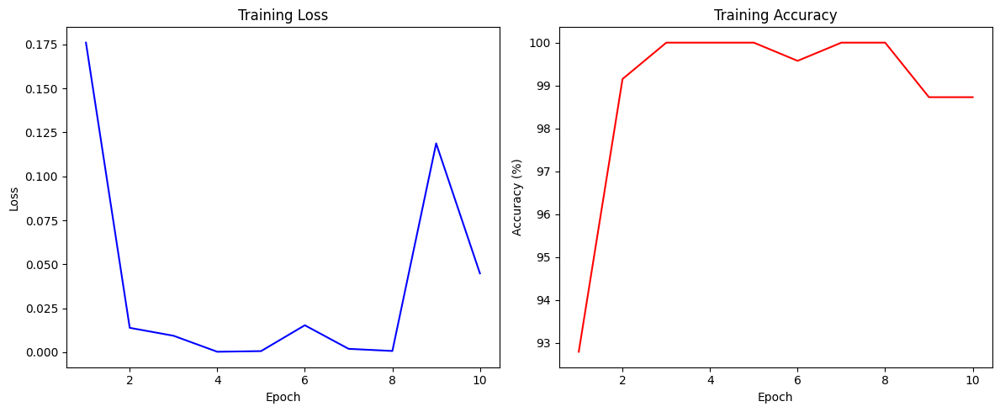


Epoch-wise Training Results:
Epoch		Loss		Accuracy
----------------------------------------
1		0.1760		92.80%
2		0.0139		99.15%
3		0.0094		100.00%
4		0.0003		100.00%
5		0.0006		100.00%
6		0.0153		99.58%
7		0.0019		100.00%
8		0.0007		100.00%
9		0.1188		98.73%
10		0.0448		98.73%


In [13]:
import matplotlib.pyplot as plt

# สร้างกราฟ Loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs + 1), train_losses, 'b-')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

# สร้างกราฟ Accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies, 'r-')
plt.title('Training Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')

plt.tight_layout()
plt.show()

# แสดงตารางผลลัพธ์
print("\nEpoch-wise Training Results:")
print("Epoch\t\tLoss\t\tAccuracy")
print("-" * 40)
for epoch, (loss, acc) in enumerate(zip(train_losses, train_accuracies), 1):
    print(f"{epoch}\t\t{loss:.4f}\t\t{acc:.2f}%")

Test accuracy: 0.6769

Classification Report:
              precision    recall  f1-score   support

        Good       1.00      0.54      0.70        46
          NG       0.47      1.00      0.64        19

    accuracy                           0.68        65
   macro avg       0.74      0.77      0.67        65
weighted avg       0.85      0.68      0.69        65



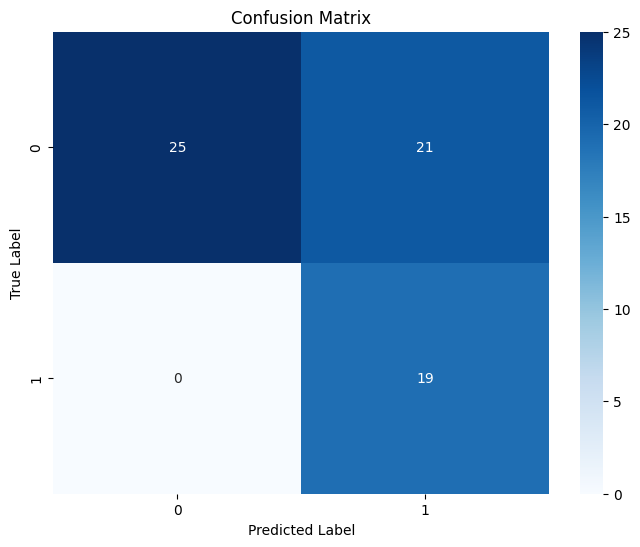

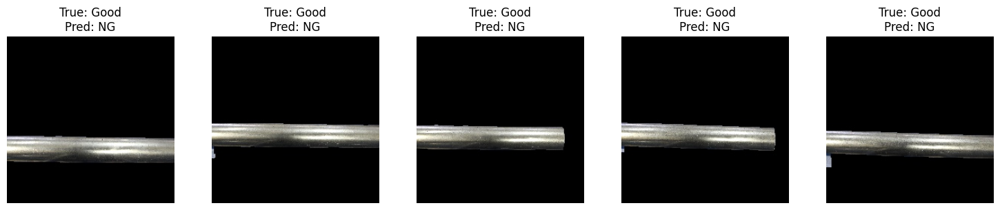

In [14]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# ประเมินผลบนชุดข้อมูลทดสอบ
model.eval()
y_pred = []
y_true = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())

y_pred = np.array(y_pred)
y_true = np.array(y_true)

# คำนวณ accuracy
accuracy = (y_pred == y_true).mean()
print(f"Test accuracy: {accuracy:.4f}")

# แสดง Classification Report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=['Good', 'NG']))

# สร้าง Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# พล็อตตัวอย่างภาพที่ทำนายผิด
misclassified_indices = np.where(y_pred != y_true)[0]
n_misclassified = min(5, len(misclassified_indices))

plt.figure(figsize=(15, 3))
for i, idx in enumerate(misclassified_indices[:n_misclassified]):
    plt.subplot(1, n_misclassified, i+1)
    img, label = test_dataset[idx]
    img = img.permute(1, 2, 0).cpu().numpy()
    img = (img * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]).clip(0, 1)
    plt.imshow(img)
    plt.title(f"True: {['Good', 'NG'][label]}\nPred: {['Good', 'NG'][y_pred[idx]]}")
    plt.axis('off')
plt.tight_layout()
plt.show()

In [15]:
# ประเมินผลโมเดลบน test set
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

test_accuracy = 100 * correct / total
print(f'Accuracy on test set: {test_accuracy:.2f}%')

Accuracy on test set: 67.69%


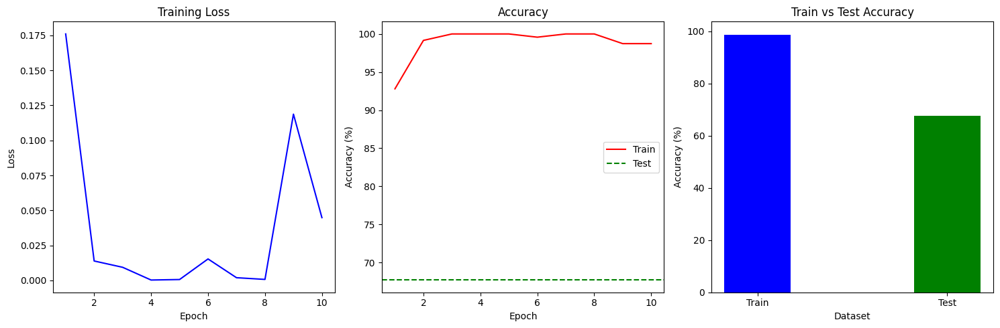


Epoch-wise Training Results:
Epoch		Loss		Accuracy
----------------------------------------
1		0.1760		92.80%
2		0.0139		99.15%
3		0.0094		100.00%
4		0.0003		100.00%
5		0.0006		100.00%
6		0.0153		99.58%
7		0.0019		100.00%
8		0.0007		100.00%
9		0.1188		98.73%
10		0.0448		98.73%

Test Accuracy: 67.69%

Difference between Train and Test Accuracy: 31.04%
Severe overfitting! Consider using regularization techniques.


In [16]:
import matplotlib.pyplot as plt
import numpy as np

# สร้างกราฟ Loss และ Accuracy
plt.figure(figsize=(15, 5))

# กราฟ Loss
plt.subplot(1, 3, 1)
plt.plot(range(1, num_epochs + 1), train_losses, 'b-')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

# กราฟ Accuracy
plt.subplot(1, 3, 2)
plt.plot(range(1, num_epochs + 1), train_accuracies, 'r-', label='Train')
plt.axhline(y=test_accuracy, color='g', linestyle='--', label='Test')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()

# ทำกราฟเปรียบเทียบ Train vs Test Accuracy
plt.subplot(1, 3, 3)
bar_width = 0.35
index = np.arange(2)
plt.bar(index, [train_accuracies[-1], test_accuracy], bar_width,
        color=['blue', 'green'])
plt.xlabel('Dataset')
plt.ylabel('Accuracy (%)')
plt.title('Train vs Test Accuracy')
plt.xticks(index, ('Train', 'Test'))

plt.tight_layout()
plt.show()

# เอาไว้แสดงตารางผลลัพธ์
print("\nEpoch-wise Training Results:")
print("Epoch\t\tLoss\t\tAccuracy")
print("-" * 40)
for epoch, (loss, acc) in enumerate(zip(train_losses, train_accuracies), 1):
    print(f"{epoch}\t\t{loss:.4f}\t\t{acc:.2f}%")

print(f"\nTest Accuracy: {test_accuracy:.2f}%")

# คำนวณความแตกต่างระหว่าง Train และ Test Accuracy
diff = train_accuracies[-1] - test_accuracy
print(f"\nDifference between Train and Test Accuracy: {diff:.2f}%")

if diff > 5:
    print("Warning: Possible overfitting detected.")
    if diff > 10:
        print("Severe overfitting! Consider using regularization techniques.")
elif diff < -5:
    print("Warning: Model might be underfitting on the training data.")
else:
    print("Model seems to be well-balanced between train and test sets.")

Evaluating:   0%|          | 0/3 [00:00<?, ?it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


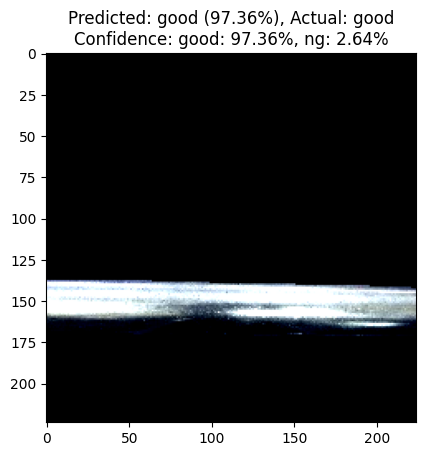

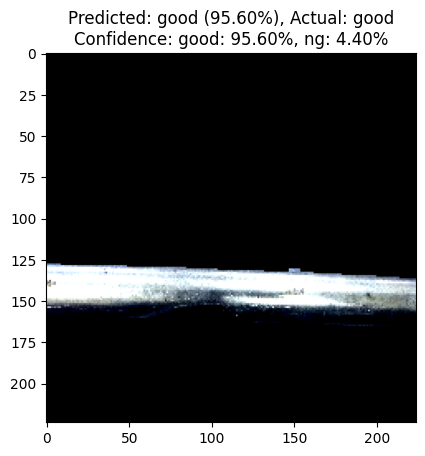

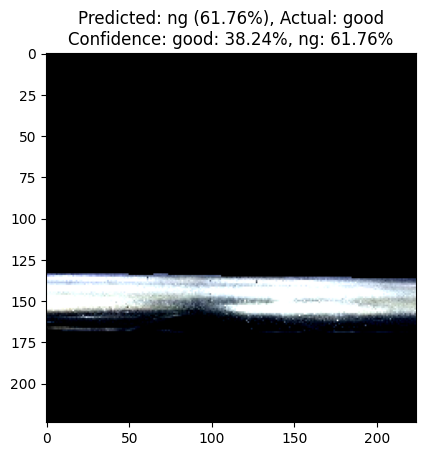

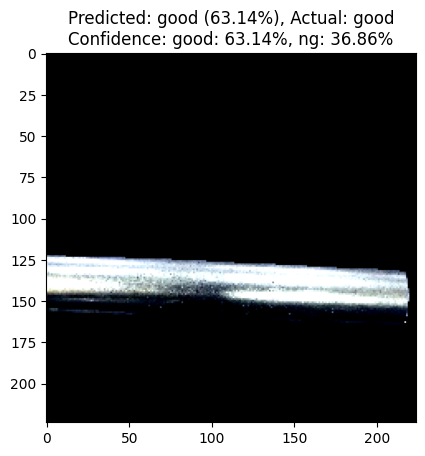

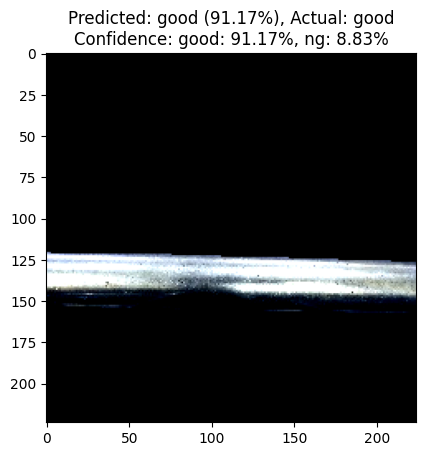

...

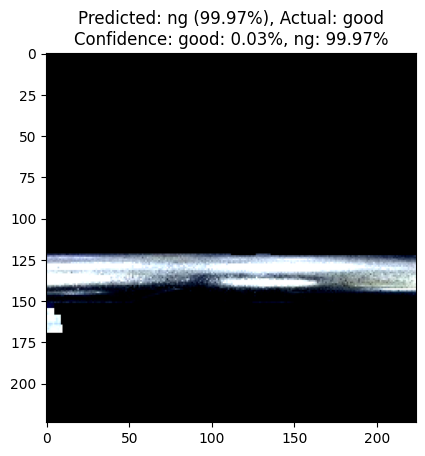

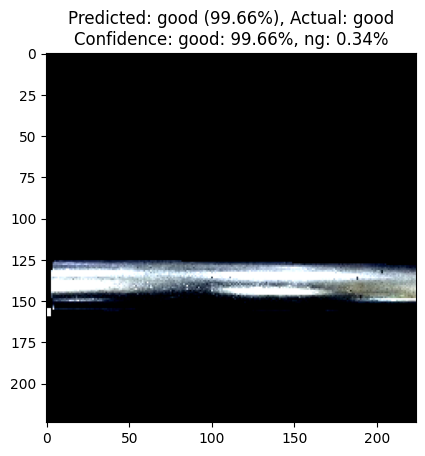

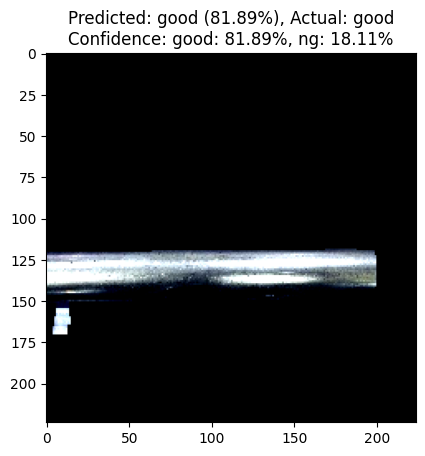

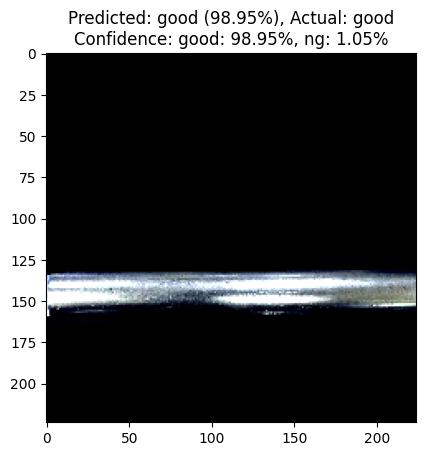

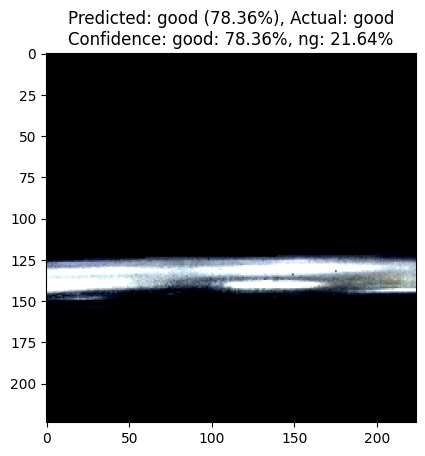

Evaluating:  33%|███▎      | 1/3 [00:06<00:12,  6.17s/it, accuracy=50]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


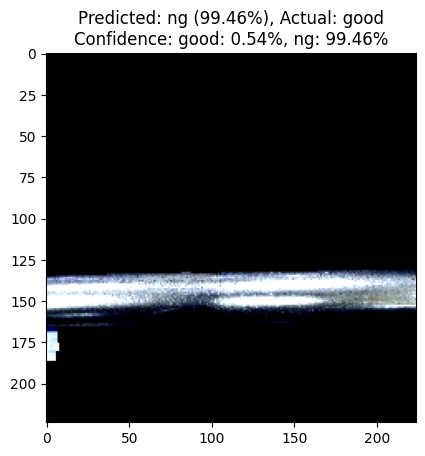

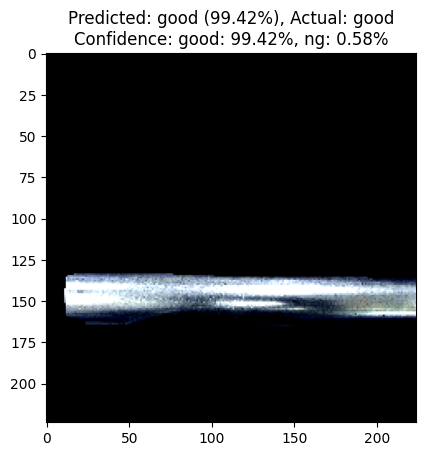

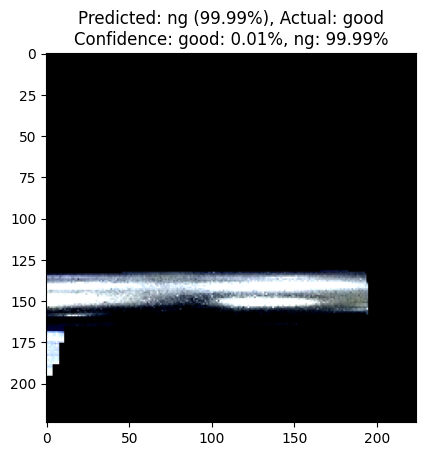

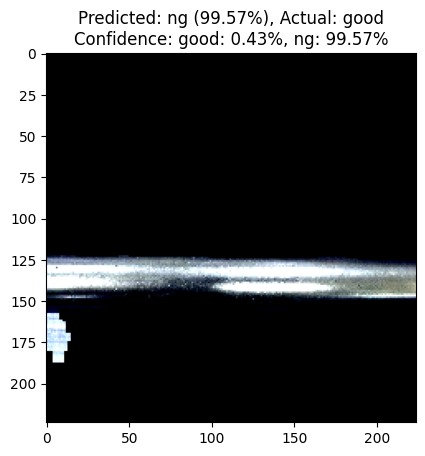

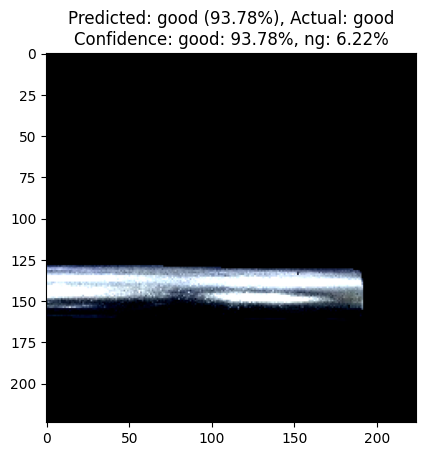

...

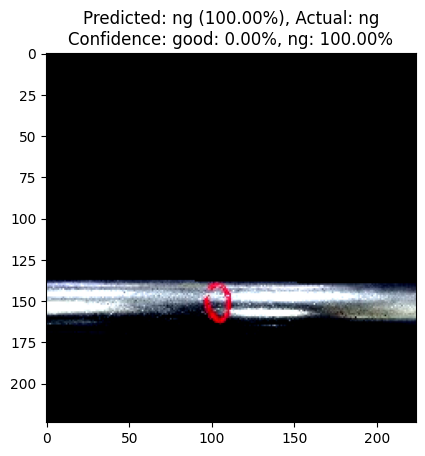

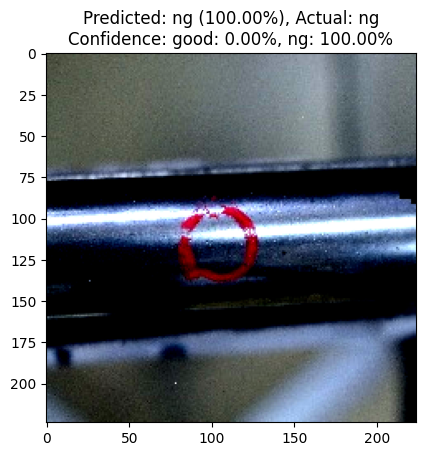

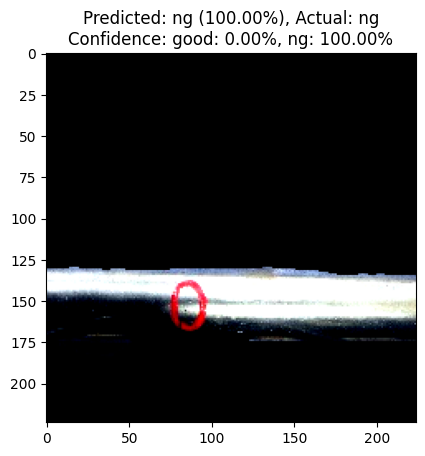

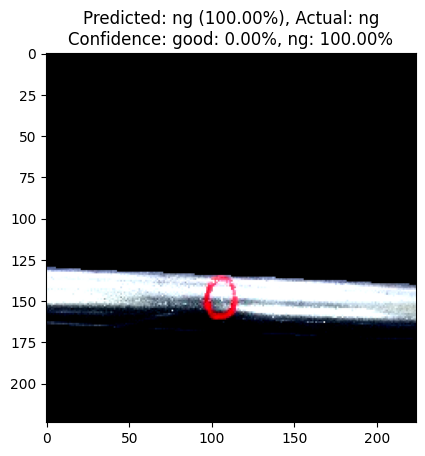

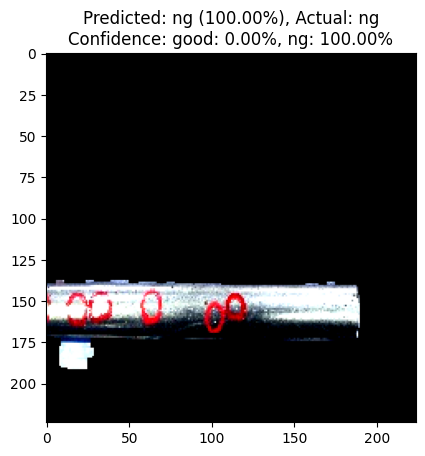

Evaluating:  67%|██████▋   | 2/3 [00:12<00:06,  6.45s/it, accuracy=67.2]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


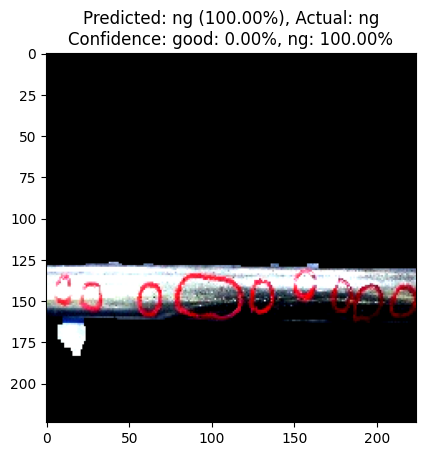

Evaluating: 100%|██████████| 3/3 [00:13<00:00,  4.35s/it, accuracy=67.7]

Accuracy on test set: 67.69%
Accuracy of class 0 (good):  54.35%
Accuracy of class 1 (ng):  100.00%


In [17]:
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

# Function โชว์รูป
def imshow(img, title):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title(title)
    plt.show()

# ประเมินผลโมเดลบน test set
model.eval()
correct = 0
total = 0
class_correct = np.zeros(2)
class_total = np.zeros(2)
pbar = tqdm(test_loader, desc='Evaluating') # progress bar
with torch.no_grad():
    for inputs, labels in pbar:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        probabilities = F.softmax(outputs, dim=1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # นับจำนวนที่ถูกต้องสำหรับแต่ละคลาส
        for i in range(len(labels)):
            label = labels[i]
            class_correct[label] += (predicted[i] == label).item()
            class_total[label] += 1

            # แสดงรูปภาพพร้อมผลการทำนายและเปอร์เซ็นต์ความมั่นใจ
            img = inputs.cpu().data[i]
            prob = probabilities[i].cpu().numpy()
            title = (f'Predicted: {["good", "ng"][predicted[i]]} '
                     f'({prob[predicted[i]]*100:.2f}%), '
                     f'Actual: {["good", "ng"][labels[i]]}\n'
                     f'Confidence: good: {prob[0]*100:.2f}%, ng: {prob[1]*100:.2f}%')
            imshow(img, title)

        pbar.set_postfix({'accuracy': 100 * correct / total})

# ผลลัพธ์
print(f'Accuracy on test set: {100 * correct / total:.2f}%')

# ผลลัพธ์สำหรับแต่ละคลาส
for i in range(2):
    if class_total[i] > 0:
        print(f'Accuracy of class {i} ({["good", "ng"][i]}): {100 * class_correct[i] / class_total[i]: .2f}%')
    else:
        print(f'No samples for class {i} ({["good", "ng"][i]})')


Evaluating:   0%|          | 0/3 [00:00<?, ?it/s]

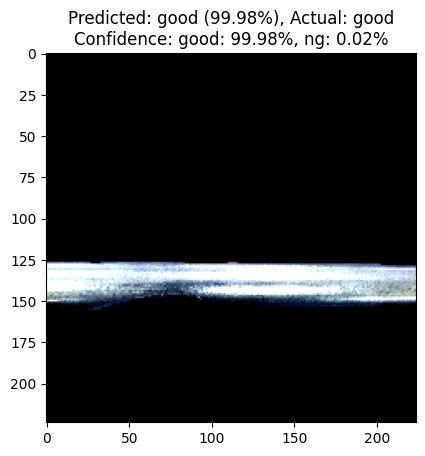

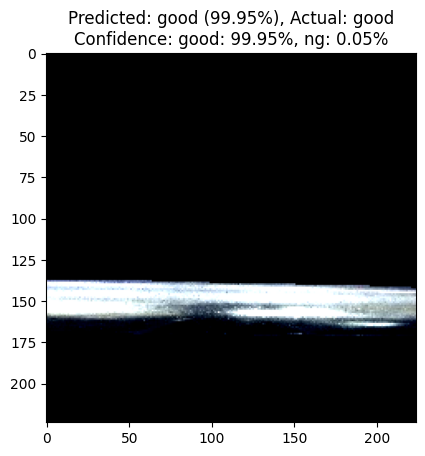

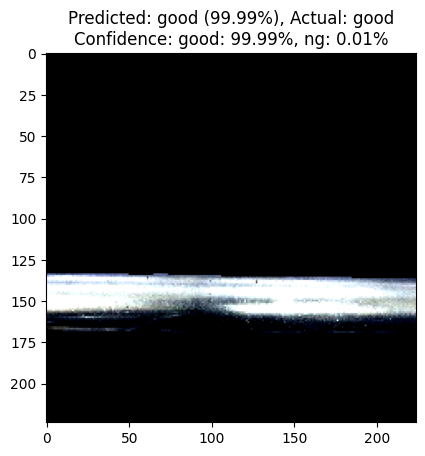

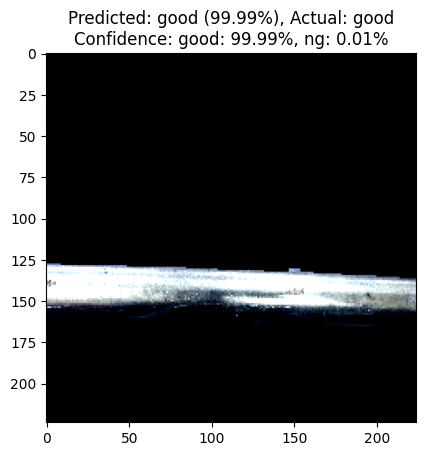

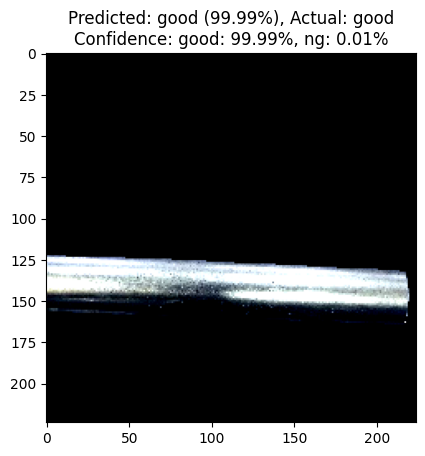

...

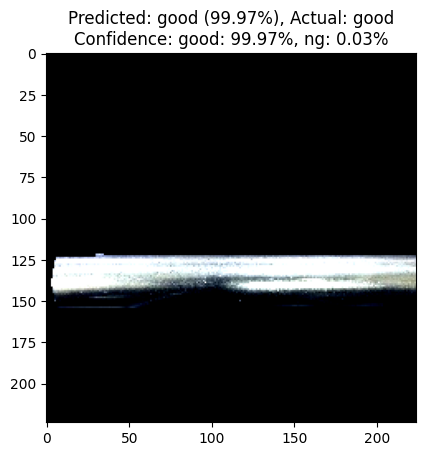

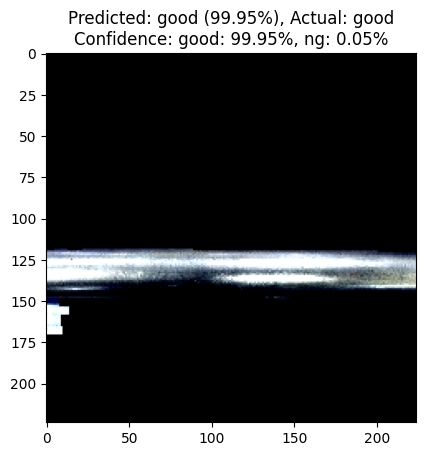

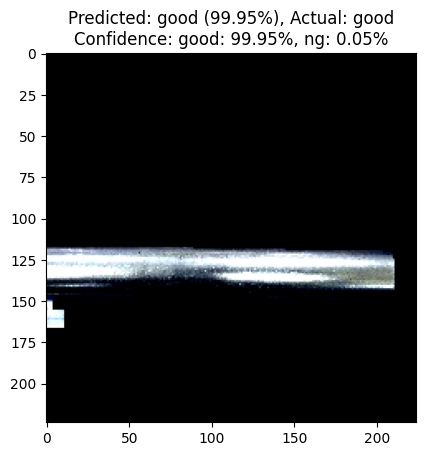

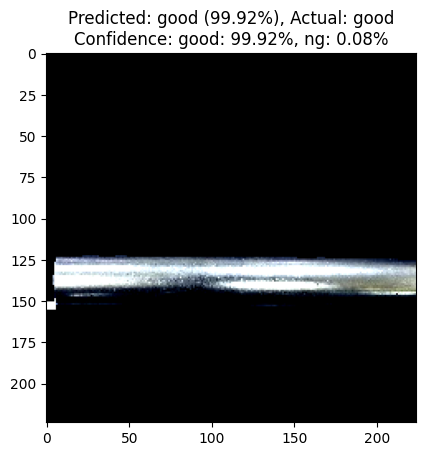

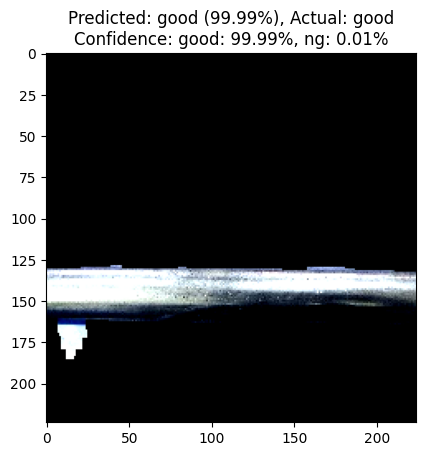

Evaluating:  33%|███▎      | 1/3 [00:12<00:25, 12.78s/it, accuracy=100]

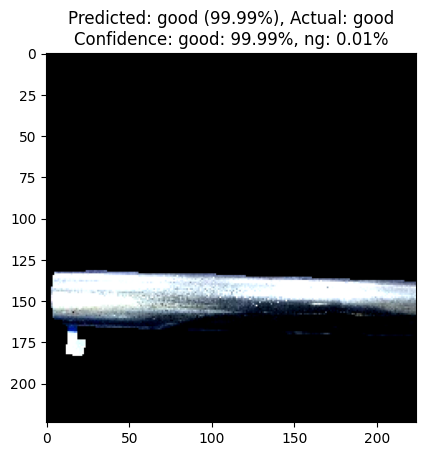

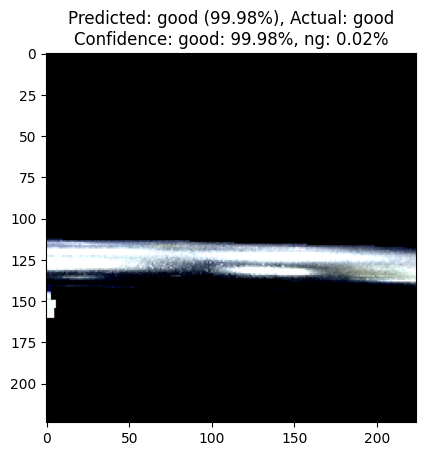

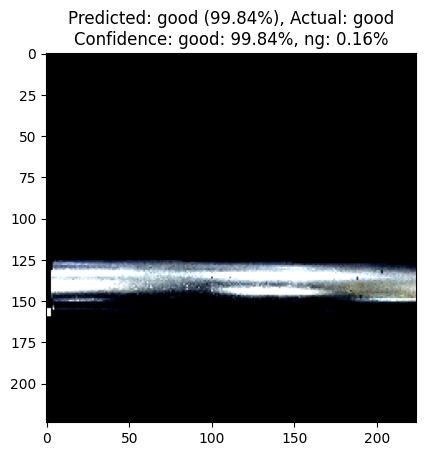

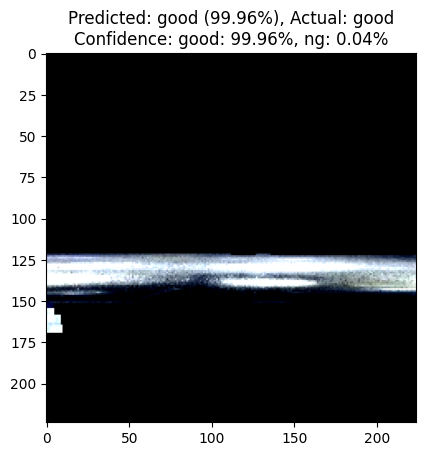

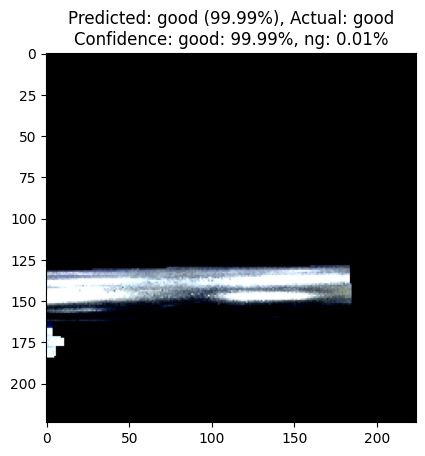

...

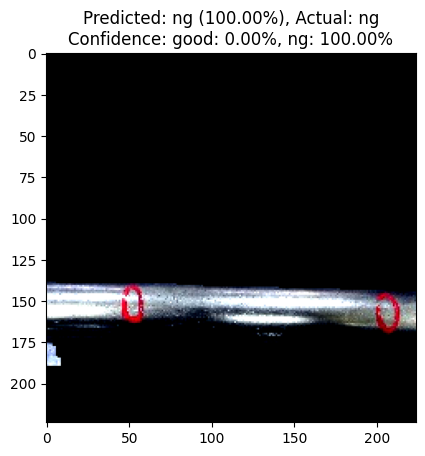

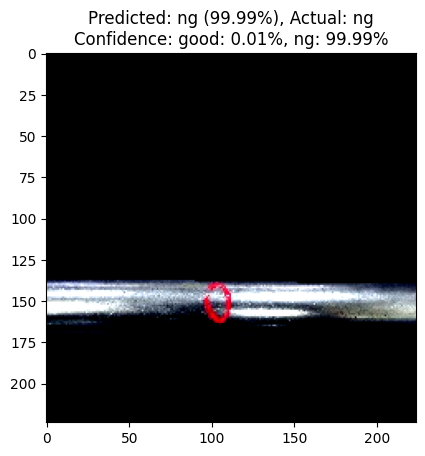

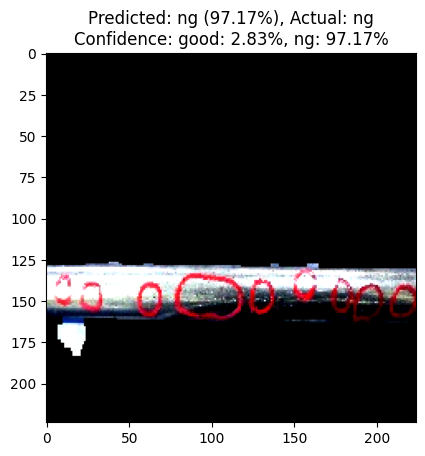

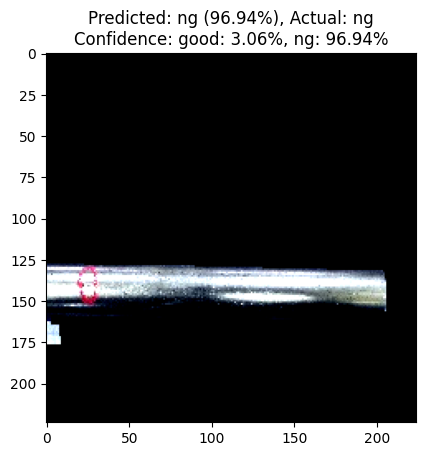

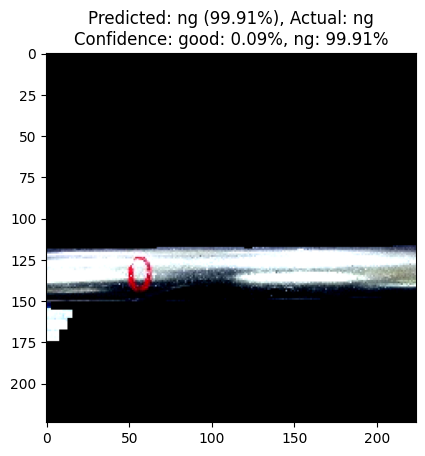

Evaluating:  67%|██████▋   | 2/3 [00:26<00:13, 13.60s/it, accuracy=100]

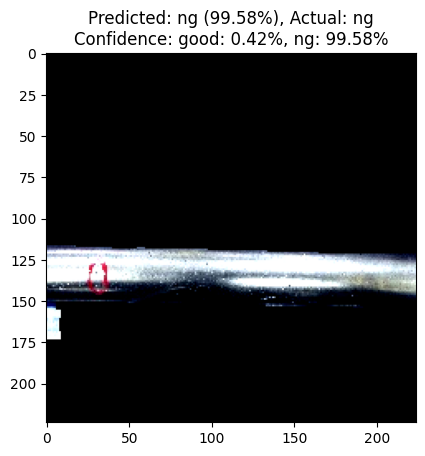

Evaluating: 100%|██████████| 3/3 [00:27<00:00,  9.20s/it, accuracy=100]

Accuracy on test set: 100.00%
Accuracy of class 0 (good):  100.00%
Accuracy of class 1 (ng):  100.00%


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F

# Function เอาไว้โชว์รูป
def imshow(img, title):
    img = img / 2 + 0.5  # unnormalize
    npimg = np.clip(img.numpy(), 0, 1)  # Clip the values to be in range [0, 1]
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title(title)
    plt.show()

# ประเมินผลโมเดลบน test set
model.eval()
correct = 0
total = 0
class_correct = np.zeros(2)
class_total = np.zeros(2)
pbar = tqdm(test_loader, desc='Evaluating') # progress bar
with torch.no_grad():
    for inputs, labels in pbar:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        probabilities = F.softmax(outputs, dim=1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # นับจำนวนที่ถูกต้องสำหรับแต่ละคลาส
        for i in range(len(labels)):
            label = labels[i]
            class_correct[label] += (predicted[i] == label).item()
            class_total[label] += 1

            # แสดงรูปภาพพร้อมผลการทำนายและเปอร์เซ็นต์ความมั่นใจ
            img = inputs.cpu().data[i]
            prob = probabilities[i].cpu().numpy()
            title = (f'Predicted: {["good", "ng"][predicted[i]]} '
                     f'({prob[predicted[i]]*100:.2f}%), '
                     f'Actual: {["good", "ng"][labels[i]]}\n'
                     f'Confidence: good: {prob[0]*100:.2f}%, ng: {prob[1]*100:.2f}%')
            imshow(img, title)

        pbar.set_postfix({'accuracy': 100 * correct / total})

# ผลลัพธ์
print(f'Accuracy on test set: {100 * correct / total:.2f}%')

# ผลลัพธ์สำหรับแต่ละคลาส
for i in range(2):
    if class_total[i] > 0:
        print(f'Accuracy of class {i} ({["good", "ng"][i]}): {100 * class_correct[i] / class_total[i]: .2f}%')
    else:
        print(f'No samples for class {i} ({["good", "ng"][i]})')


In [1]:
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
from tqdm import tqdm

# สร้างไฟล์ PDF
pdf_pages = PdfPages('evaluation_results.pdf')

# Function เอาไว้โชว์รูปและบันทึกลงใน PDF
def imshow(img, title):
    img = img / 2 + 0.5  # unnormalize
    npimg = np.clip(img.numpy(), 0, 1)  # Clip the values to be in range [0, 1]
    plt.figure(figsize=(10, 8))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.title(title)
    pdf_pages.savefig()  # บันทึกรูปลงใน PDF
    plt.close()  # ปิด figure เพื่อประหยัด memory

# ประเมินผลโมเดลบน test set
model.eval()
correct = 0
total = 0
class_correct = np.zeros(2)
class_total = np.zeros(2)
pbar = tqdm(test_loader, desc='Evaluating')  # progress bar

with torch.no_grad():
    for inputs, labels in pbar:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        probabilities = F.softmax(outputs, dim=1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # นับจำนวนที่ถูกต้องสำหรับแต่ละคลาส
        for i in range(len(labels)):
            label = labels[i]
            class_correct[label] += (predicted[i] == label).item()
            class_total[label] += 1

            # แสดงรูปภาพพร้อมผลการทำนายและเปอร์เซ็นต์ความมั่นใจ
            img = inputs.cpu().data[i]
            prob = probabilities[i].cpu().numpy()
            title = (f'Predicted: {["good", "ng"][predicted[i]]} '
                     f'({prob[predicted[i]]*100:.2f}%), '
                     f'Actual: {["good", "ng"][labels[i]]}\n'
                     f'Confidence: good: {prob[0]*100:.2f}%, ng: {prob[1]*100:.2f}%')
            imshow(img, title)

        pbar.set_postfix({'accuracy': 100 * correct / total})

# ผลลัพธ์
plt.figure(figsize=(10, 6))
plt.text(0.1, 0.9, f'Accuracy on test set: {100 * correct / total:.2f}%', fontsize=12)
y = 0.8
for i in range(2):
    if class_total[i] > 0:
        plt.text(0.1, y, f'Accuracy of class {i} ({["good", "ng"][i]}): {100 * class_correct[i] / class_total[i]:.2f}%', fontsize=12)
    else:
        plt.text(0.1, y, f'No samples for class {i} ({["good", "ng"][i]})', fontsize=12)
    y -= 0.1
plt.axis('off')
pdf_pages.savefig()
plt.close()

# ปิดไฟล์ PDF
pdf_pages.close()

print("Results have been saved to 'evaluation_results.pdf'")

NameError: name 'model' is not defined

In [ ]:
import os

main_path = "/content/drive/MyDrive/Colab Notebooks"
if not os.path.exists(main_path):
    os.makedirs(main_path)


In [ ]:
import torch
import torch.nn as nn
from torchvision import models
import os

torch.save(model.state_dict(), os.path.join(main_path, 'shaft_model.pth'))